<a href="https://colab.research.google.com/github/Ananya-AJ/CMPE255-Data-Mining/blob/main/Assignment2-pycaret-gradio/Clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pycaret --user
!pip install Jinja2==2.11.3
!pip install markupsafe==2.0.1

In [ ]:
!pip install pandas
!pip install kaggle

In [ ]:
import pandas as pd
import numpy as np
import kaggle

When using it first time, uncomment lines below and run.

In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d ashydv/bank-marketing

mkdir: cannot create directory ‘/root/.kaggle’: File exists
bank-marketing.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip bank-marketing.zip

Archive:  bank-marketing.zip
replace bankmarketing.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n


In [ ]:
bm_data = pd.read_csv('/content/bankmarketing.csv')
bm_data.shape
bm_data.head()
data = bm_data.sample(frac=0.95, random_state=786)
data_unseen = bm_data.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

data.replace([np.inf, -np.inf], np.nan,inplace=True)
data_unseen.replace([np.inf, -np.inf], np.nan,inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (39129, 21)
Unseen Data For Predictions: (2059, 21)


Pycaret setup for data

In [ ]:
data.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

Convert age from numeric to categorical value

In [ ]:
data['age_bin'] = pd.cut(data['age'], [0, 20, 30, 40, 50, 60, 70, 80, 90, 100], 
                              labels=['0-20', '20-30', '30-40', '40-50','50-60','60-70','70-80', '80-90','90-100'])
data_unseen['age_bin'] = pd.cut(data_unseen['age'], [0, 20, 30, 40, 50, 60, 70, 80, 90, 100], 
                              labels=['0-20', '20-30', '30-40', '40-50','50-60','60-70','70-80', '80-90','90-100'])
data  = data.drop('age',axis = 1)
data_unseen  = data_unseen.drop('age',axis = 1)

In [ ]:

data.head()

,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,age_bin
0,blue-collar,married,professional.course,unknown,no,no,cellular,jul,fri,109,2,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1,no,30-40
1,blue-collar,married,basic.6y,unknown,no,no,telephone,may,fri,108,2,999,0,nonexistent,1.1,93.994,-36.4,4.859,5191.0,no,40-50
2,unemployed,single,high.school,no,yes,no,telephone,aug,tue,172,2,999,0,nonexistent,-2.9,92.201,-31.4,0.883,5076.2,no,20-30
3,housemaid,married,basic.4y,no,no,no,cellular,aug,thu,179,1,999,0,nonexistent,1.4,93.444,-36.1,4.963,5228.1,no,30-40
4,blue-collar,married,basic.4y,unknown,no,yes,cellular,nov,fri,105,1,999,0,nonexistent,-0.1,93.200,-42.0,4.021,5195.8,no,40-50


Data preprocessing

In [ ]:
data.isnull().sum()*100/data.shape[0]
data_unseen.isnull().sum()*100/data_unseen.shape[0]

job               0.0
marital           0.0
education         0.0
default           0.0
housing           0.0
loan              0.0
contact           0.0
month             0.0
day_of_week       0.0
duration          0.0
campaign          0.0
pdays             0.0
previous          0.0
poutcome          0.0
emp.var.rate      0.0
cons.price.idx    0.0
cons.conf.idx     0.0
euribor3m         0.0
nr.employed       0.0
y                 0.0
age_bin           0.0
dtype: float64

In [ ]:

from pycaret.clustering import *

exp_cluster = setup(data = data, normalize = True, 
                   ignore_features = ['month','day_of_week','duration','pdays','education',],
                   session_id = 123)

prep_pipe = get_config('prep_pipe') 
df0 = prep_pipe.transform(data)


,Description,Value
0,session_id,123
1,Original Data,"(39129, 21)"
2,Missing Values,False
3,Numeric Features,6
4,Categorical Features,10
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(39129, 55)"
9,CPU Jobs,-1


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True,
                                      features_todrop=['month', 'day_of_week',
                                                       'duration', 'pdays',
                                                       'education'],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='UNSUPERVISED_DUMMY_TARGET',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='most frequent',
                                f...
                ('P_transform', 'passthrough'), ('binn', 'passthrough'),
              

In [ ]:
kmeans = create_model('kmeans')
print(kmeans)
kmodes = create_model('kmodes', num_clusters = 4)
print(kmodes)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0349,3930.4,2.7686,0,0,0


INFO:logs:create_model_container: 2
INFO:logs:master_model_container: 2
INFO:logs:display_container: 3
INFO:logs:KModes(cat_dissim=<function matching_dissim at 0x7fa5c1759f80>, init='Cao',
       max_iter=100, n_clusters=4, n_init=1, n_jobs=-1, random_state=123,
       verbose=0)
INFO:logs:create_model() succesfully completed......................................


KModes(cat_dissim=<function matching_dissim at 0x7fa5c1759f80>, init='Cao',
       max_iter=100, n_clusters=4, n_init=1, n_jobs=-1, random_state=123,
       verbose=0)


In [ ]:
models()


INFO:logs:gpu_param set to False


,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


In [ ]:
kmean_results = assign_model(kmeans)
kmean_results.head()

INFO:logs:Initializing assign_model()
INFO:logs:assign_model(model=KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0), transformation=False, score=True, verbose=True)
INFO:logs:Checking exceptions
INFO:logs:Determining Trained Model
INFO:logs:Trained Model : K-Means Clustering
INFO:logs:Copying data
INFO:logs:(39129, 22)
INFO:logs:assign_model() succesfully completed......................................


,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,...,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,age_bin,Cluster
0,blue-collar,married,professional.course,unknown,no,no,cellular,jul,fri,109,...,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1,no,30-40,Cluster 0
1,blue-collar,married,basic.6y,unknown,no,no,telephone,may,fri,108,...,0,nonexistent,1.1,93.994,-36.4,4.859,5191.0,no,40-50,Cluster 0
2,unemployed,single,high.school,no,yes,no,telephone,aug,tue,172,...,0,nonexistent,-2.9,92.201,-31.4,0.883,5076.2,no,20-30,Cluster 2
3,housemaid,married,basic.4y,no,no,no,cellular,aug,thu,179,...,0,nonexistent,1.4,93.444,-36.1,4.963,5228.1,no,30-40,Cluster 0
4,blue-collar,married,basic.4y,unknown,no,yes,cellular,nov,fri,105,...,0,nonexistent,-0.1,93.200,-42.0,4.021,5195.8,no,40-50,Cluster 0


In [ ]:
#import gradio
!pip install -q gradio

Use gradio to demo

PCA plot

In [ ]:
plot_model(kmeans)

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


Elbow plot and distribution plot

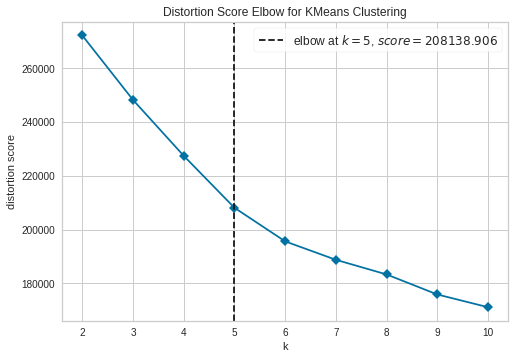

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(kmeans, plot = 'elbow')

In [ ]:

plot_model(kmeans, plot = 'distribution')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


Predict for unseen values and save model

In [ ]:
unseen_predictions = predict_model(kmeans, data=data_unseen)

save_model(kmeans,'Final KMeans Model 25Nov2020')

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0), ml_usecase=MLUsecase.CLUSTERING)
INFO:logs:Initializing save_model()
INFO:logs:save_model(model=KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0), model_name=Final KMeans Model 25Nov2020, prep_pipe_=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True,
                                      features_todrop=['month', 'day_of_week',
                                                       'duration', 'pdays',
                                                       'educ

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True,
                                       features_todrop=['month', 'day_of_week',
                                                        'duration', 'pdays',
                                                        'education'],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='UNSUPERVISED_DUMMY_TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='most frequent',
                                 f...
                 ('fix_perfect', 'passthrough'),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),


In [ ]:
unseen_predictions.head()

,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,...,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,age_bin,Cluster
0,services,married,basic.9y,unknown,no,no,telephone,may,mon,198,...,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,40-50,Cluster 0
1,blue-collar,single,high.school,no,no,yes,telephone,may,mon,137,...,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,20-30,Cluster 0
2,housemaid,married,basic.4y,no,no,yes,telephone,may,mon,266,...,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,30-40,Cluster 0
3,services,married,high.school,unknown,yes,no,telephone,may,mon,787,...,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,40-50,Cluster 0
4,blue-collar,married,basic.9y,no,yes,no,telephone,may,mon,812,...,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,50-60,Cluster 0


Load the pickled model

In [ ]:
saved_kmeans = load_model('Final KMeans Model 25Nov2020')
new_prediction = predict_model(saved_kmeans, data=data_unseen)
new_prediction.head()

INFO:logs:Initializing load_model()
INFO:logs:load_model(model_name=Final KMeans Model 25Nov2020, platform=None, authentication=None, verbose=True)
INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True,
                                      features_todrop=['month', 'day_of_week',
                                                       'duration', 'pdays',
                                                       'education'],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='UNSUPERVISED_DUMMY_TARGET',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='most frequent',
                

Transformation Pipeline and Model Successfully Loaded


,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,...,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,age_bin,Cluster
0,services,married,basic.9y,unknown,no,no,telephone,may,mon,198,...,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,40-50,Cluster 0
1,blue-collar,single,high.school,no,no,yes,telephone,may,mon,137,...,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,20-30,Cluster 0
2,housemaid,married,basic.4y,no,no,yes,telephone,may,mon,266,...,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,30-40,Cluster 0
3,services,married,high.school,unknown,yes,no,telephone,may,mon,787,...,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,40-50,Cluster 0
4,blue-collar,married,basic.9y,no,yes,no,telephone,may,mon,812,...,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,50-60,Cluster 0
